In [1]:
import numpy as np
import pickle

X, Y = 0, 1

class MDSimulation:
    def __init__(self, pos, vel, r1, m1, counter):  
        self.pos = np.asarray(pos, dtype=float)
        self.vel = np.asarray(vel, dtype=float)
        self.n = self.pos.shape[0]
        self.radius = r1
        self.mass = m1
        self.nsteps = 0
        self.counter = counter

    def advance(self, dt):
        self.nsteps += 1
        self.pos += self.vel * dt
        self.pos %= 1.0  # periodic boundaries

        delta = self.pos[:, np.newaxis, :] - self.pos[np.newaxis, :, :]
        delta -= np.round(delta)  # minimum image convention
        dist = np.linalg.norm(delta, axis=-1)
        radii_pair = 2 * self.radius

        iarr, jarr = np.where(dist < radii_pair)
        k = iarr < jarr
        iarr, jarr = iarr[k], jarr[k]

        for i, j in zip(iarr, jarr):
            pos_i, vel_i = self.pos[i], self.vel[i]
            pos_j, vel_j = self.pos[j], self.vel[j]
            rel_pos = pos_i - pos_j
            rel_pos -= np.round(rel_pos)
            r_rel = rel_pos @ rel_pos
            rel_vel = vel_i - vel_j
            nor = rel_pos / np.sqrt(r_rel)
            v_rel_n = np.dot(rel_vel, nor)
            if v_rel_n > 0:
                continue
            self.counter += 1
            delta_v = nor * v_rel_n
            self.vel[i] += -delta_v
            self.vel[j] += delta_v

# Parameters
n = 1000  
r1 = 3e-3
sbar = 35 * 0.005 / np.sqrt(2)
FPS = 60
dt = 1 / FPS
m1 = 1
frames = 500
n_runs = 10

# Store results from all runs
all_runs_velocities = []

for run in range(n_runs):
    print(f"this is run {run}")
    # Random initial conditions
    pos = np.random.random((n, 2))
    theta = np.random.random(n) * 2 * np.pi
    s0 = sbar
    vel = (s0 * np.array((np.cos(theta), np.sin(theta)))).T
    sim = MDSimulation(pos, vel, r1, m1, counter=0)

    run_velocities = []
    for i in range(frames):
        sim.advance(dt)
        run_velocities.append(sim.vel.copy())

    all_runs_velocities.append(run_velocities)

# Save to file
with open("all_velocities_10runs.pkl", "wb") as f:
    pickle.dump(all_runs_velocities, f)


this is run 0
this is run 1
this is run 2
this is run 3
this is run 4
this is run 5
this is run 6
this is run 7
this is run 8
this is run 9


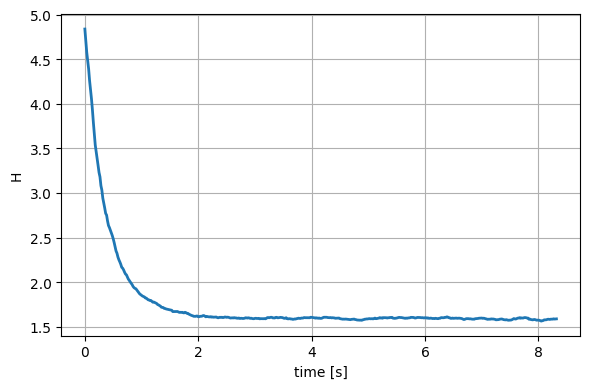

In [1]:
### Tidied‑up core loop

from glob import glob
import numpy as np, pickle, matplotlib.pyplot as plt

# --- constants --------------------------------------------------------------
FPS          = 60.0
dt           = 1.0 / FPS
nbins        = 50
vmax         = 2 * 35 * 0.005 / np.sqrt(2)
bins         = np.linspace(0, vmax, nbins + 1)
sgrid        = 0.5 * (bins[1:] + bins[:-1])
dv           = np.diff(bins)[0]

def get_speeds(vel):
    """Return flattened speed array from (..., 2) velocity field."""
    return np.linalg.norm(vel, axis=-1).ravel()

# --- load -------------------------------------------------------------------
file_paths = sorted(glob("velocities/run_*.pkl"))
all_runs   = [pickle.load(open(p, "rb")) for p in file_paths]  # list of arrays

# --- pick one run (or loop over them) ---------------------------------------
run_idx = 0                         # <- change as needed
velocities = all_runs[run_idx]      # shape: (T, N, 2)

# --- compute H(t) -----------------------------------------------------------
H_times, H_vals = [], []
for t, vel in enumerate(velocities):
    speeds       = get_speeds(vel)
    hist, _      = np.histogram(speeds, bins=bins, density=True)
    valid        = hist > 0
    h_val        = np.sum(hist[valid] * np.log(hist[valid])) * dv
    H_times.append(t * dt)
    H_vals.append(h_val)

# --- plot -------------------------------------------------------------------
plt.figure(figsize=(6, 4))
plt.plot(H_times, H_vals, lw=2)
plt.xlabel('time [s]'); plt.ylabel('H'); plt.grid(True)
plt.tight_layout()
plt.show()


In [2]:
# with open("Hfunctional1_postcomputed.pkl", "rb") as f:
#     H_times, H_vals = pickle.load(f)



In [3]:
import numpy as np

sbar11 = 35 * 0.005 / np.sqrt(2)


mean_KE11 = 0.5 * sbar11**2
print(mean_KE11)

0.007656250000000001


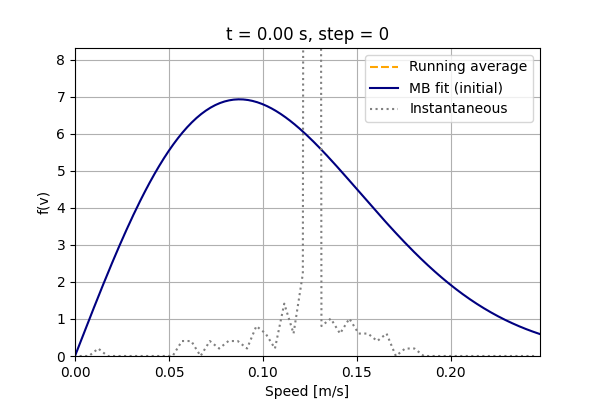

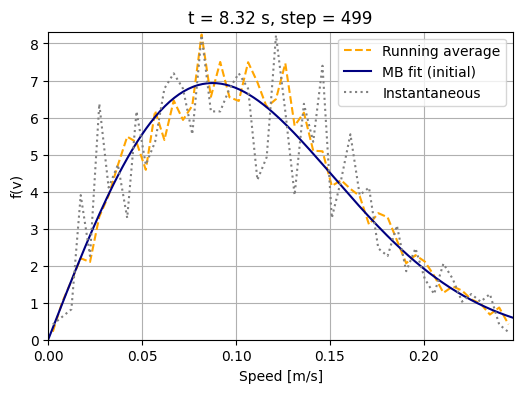

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from IPython.display import Image, display


### Tidied‑up core loop

from glob import glob
import numpy as np, pickle, matplotlib.pyplot as plt

# --- constants --------------------------------------------------------------
FPS          = 60.0
dt           = 1.0 / FPS
nbins        = 50
vmax         = 2 * 35 * 0.005 / np.sqrt(2)
bins         = np.linspace(0, vmax, nbins + 1)
sgrid        = 0.5 * (bins[1:] + bins[:-1])
dv           = np.diff(bins)[0]

def get_speeds(vel):
    """Return flattened speed array from (..., 2) velocity field."""
    return np.linalg.norm(vel, axis=-1).ravel()

# --- load -------------------------------------------------------------------
file_paths = sorted(glob("velocities/run_*.pkl"))
all_runs   = [pickle.load(open(p, "rb")) for p in file_paths]  # list of arrays

# --- pick one run (or loop over them) ---------------------------------------
run_idx = 0                         # <- change as needed
all_velocities = all_runs[run_idx]      # shape: (T, N, 2)


# Simulation parameters
FPS = 60
dt = 1 / FPS
n = all_velocities[0].shape[0]
frames = len(all_velocities)
IAV_START = int(0.2 * frames)

# Histogram binning
nbars = 50
sbar = 35 * 0.005 / np.sqrt(2)
vmax = 2 * sbar
bins = np.linspace(0, vmax, nbars + 1)
sgrid = 0.5 * (bins[1:] + bins[:-1])
dv = sgrid[1] - sgrid[0]

def get_speeds(vel):
    return np.hypot(vel[:, 0], vel[:, 1])

# MB fit from initial state
initial_speeds = get_speeds(all_velocities[0])
mean_KE = 0.5 * np.sum(initial_speeds**2) / n
a0 = 1.0 / mean_KE
sgrid_hi = np.linspace(0, vmax, 200)
f_MB = a0 * sgrid_hi * np.exp(-0.5 * a0 * sgrid_hi**2)

# Plot setup
fig, ax = plt.subplots(figsize=(6, 4))
line_MB, = ax.plot(sgrid_hi, f_MB, color='navy', label="MB distribution")
line_hist, = ax.plot([], [], '--', color='orange', label="Running average")
line_inst, = ax.plot([], [], ':', color='gray', label="Instantaneous")
ax.set_xlim(0, vmax)
ax.set_ylim(0, np.max(f_MB) * 1.2)
ax.set_xlabel("Velocity magnitude")
ax.set_ylabel("f(v)")
ax.set_title("Velocity Distribution")
ax.grid(True)
ax.legend()

# Running average
mb_est = np.zeros_like(sgrid)

def animate(i):
    global mb_est
    vel = all_velocities[i]
    speeds = get_speeds(vel)
    hist, _ = np.histogram(speeds, bins=bins, density=True)

    if i >= IAV_START:
        mb_est += (hist - mb_est) / (i - IAV_START + 1)
        line_hist.set_data(sgrid, mb_est)
    else:
        line_hist.set_data([], [])

    line_inst.set_data(sgrid, hist)
    ax.set_title(f"frame = {i+1}")
    return line_hist, line_MB, line_inst

ani = animation.FuncAnimation(
    fig, animate, frames=frames, interval=1000 / FPS, blit=True)
#plt.close(fig)

ani.save("velocity_distribution_evolution123.gif", writer="pillow", fps=FPS)




# After saving the GIF
display(Image(filename="velocity_distribution_evolution123.gif"))



Loaded 500 runs


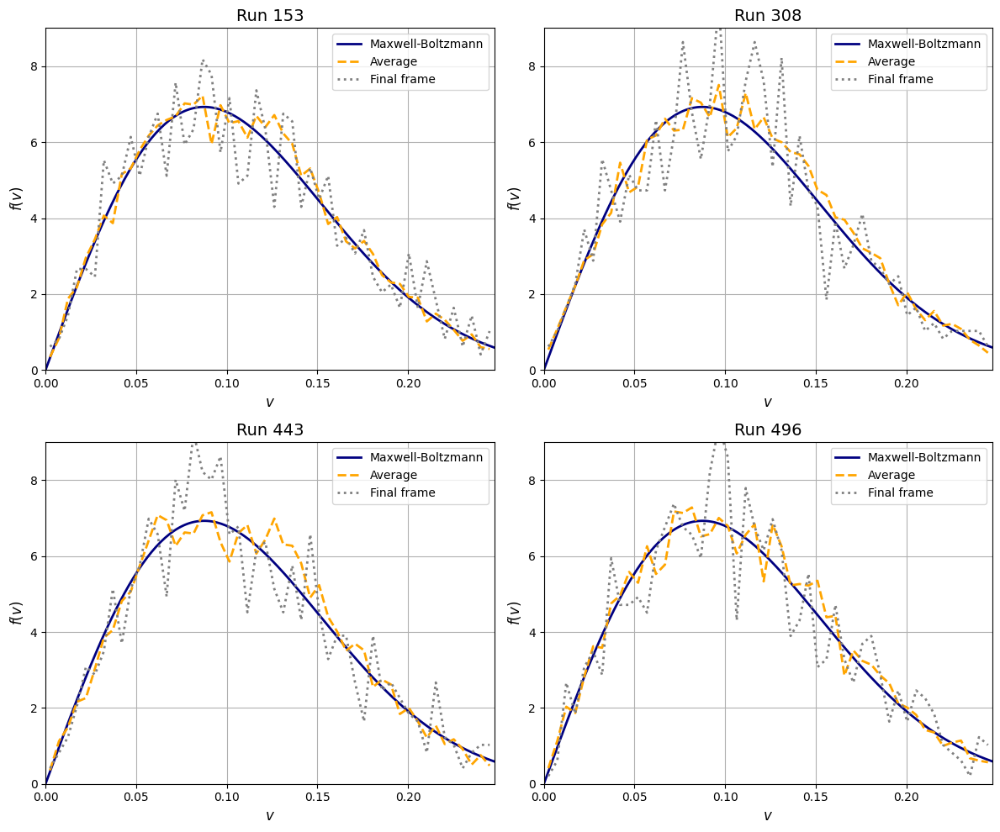

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
from glob import glob

# ---------------------------------------------------------------------------
# constants
FPS   = 60
dt    = 1.0 / FPS
NBINS = 50
VMAX  = 2 * 35 * 0.005 / np.sqrt(2)
BINS  = np.linspace(0, VMAX, NBINS + 1)
SGRID = 0.5 * (BINS[1:] + BINS[:-1])

def get_speeds(vel):
    return np.linalg.norm(vel, axis=-1).ravel()

# ---------------------------------------------------------------------------
# load runs
file_paths = sorted(glob("velocities/run_*.pkl"))
all_runs = [pickle.load(open(p, "rb")) for p in file_paths]
print(f"Loaded {len(all_runs)} runs")

selected_runs = [153, 308, 443, 496]  # choose 4 runs
runs = [all_runs[i] for i in selected_runs]

# parameters
frames = min(len(run) for run in runs)
IAV_START = int(0.2 * frames)

# MB reference distributions
MB_refs = []
for run in runs:
    speeds0 = get_speeds(run[0])
    mean_KE = 0.5 * np.mean(speeds0**2)
    a0 = 1.0 / mean_KE
    v_hi = np.linspace(0, VMAX, 200)
    MB_refs.append((v_hi, a0 * v_hi * np.exp(-0.5 * a0 * v_hi**2)))

# ---------------------------------------------------------------------------
# Compute running averages up to final frame
mb_ests = [np.zeros_like(SGRID) for _ in runs]

for frame in range(frames):
    for k, run in enumerate(runs):
        speeds = get_speeds(run[frame])
        hist, _ = np.histogram(speeds, bins=BINS, density=True)
        
        if frame >= IAV_START:
            mb_ests[k] += (hist - mb_ests[k]) / (frame - IAV_START + 1)

# ---------------------------------------------------------------------------
# Plot final frame (static 2×2 panel)
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

for k, ax in enumerate(axes):
    v_hi, f_MB = MB_refs[k]
    speeds_final = get_speeds(runs[k][-1])
    hist_final, _ = np.histogram(speeds_final, bins=BINS, density=True)
    
    # MB reference
    ax.plot(v_hi, f_MB, color='navy', lw=2, label="Maxwell-Boltzmann")
    # Running average
    ax.plot(SGRID, mb_ests[k], '--', color='orange', lw=2, label="Average")
    # Instantaneous final
    ax.plot(SGRID, hist_final, ':', color='gray', lw=2, label="Final frame")
    
    ax.set_xlim(0, VMAX)
    ax.set_ylim(0, f_MB.max() * 1.3)
    ax.set_title(f"Run {selected_runs[k]}", fontsize=14)
    ax.set_xlabel(r"$v$", fontsize=12)
    ax.set_ylabel(r"$f(v)$", fontsize=12)
    ax.grid(True)
    ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig("velocity_distribution_panel_final.png", dpi=300)
plt.show()
